In [4]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import util

Using TensorFlow backend.


# Explore test data fmt

Each condition contains multiple tiffs, each of which are a 96? deep z stack



In [8]:
%%bash
tree -d data/Denoising_Planaria/
cat data/Denoising_Planaria/Readme.md

data/Denoising_Planaria/
├── test_data
│   ├── condition_1
│   ├── condition_2
│   ├── condition_3
│   └── GT
└── train_data

6 directories
*Planaria Denoising experiment*


`./train_data`  
	
the corresponding low and high pairs of image patches (in python/numpy npz file format)

`./test_data`
	
the test stacks used for the analysis, 3 low conditions (C1,C2,C3) and a GT condition


In [11]:
from __future__ import print_function, unicode_literals, absolute_import, division
import numpy as np
import matplotlib.pyplot as plt
from csbdeep.models import CARE
from csbdeep.utils import plot_some
from tifffile import imread

import os
from os.path import join as pj
from os.path import split as ps

from csbdeep.data import Normalizer, PercentileNormalizer


import pandas as pd
import seaborn as sns
from skimage.measure import compare_ssim as ssim


In [16]:
m = '2019-04-01-planaria-1'
ddir = 'data/Denoising_Planaria/test_data/GT'
y = imread('data/Denoising_Planaria/test_data/GT/EXP278_Smed_fixed_RedDot1_sub_5_N7_m0001.tif')
print(y.shape)
x = imread('data/Denoising_Planaria/test_data/condition_1/EXP278_Smed_fixed_RedDot1_sub_5_N7_m0001.tif')

(95, 1024, 1024)


In [15]:
model = CARE(config=None, name=m, basedir='models')

(95, 1024, 1024)
Instructions for updating:
Colocations handled automatically by placer.
Loading network weights from 'weights_best.h5'.


In [29]:
# pred = model.predict_probabilistic(x, 'ZYX', PercentileNormalizer(), n_tiles=(1,4,4))
pred = model.predict_probabilistic(x, 'ZYX', n_tiles=(1,4,4))

100%|██████████| 16/16 [00:13<00:00,  1.19it/s] 


In [27]:
def metrics(x, y, pred, model_name, plot=True):
    x = np.array(x, dtype='float64')
    y = np.array(y, dtype='float64')
    
    d_pred = {'ssim':[],  'nrmse': []}
    d_input = {'ssim':[],  'nrmse': []}
    
    d_pred['ssim'].append(ssim(y, pred))
    d_input['ssim'].append(ssim(y, x))

    d_pred['nrmse'].append(util.nrmse_3d(y, pred))
    d_input['nrmse'].append(util.nrmse_3d(y, x))

    # Some jank longform dataframe creation
    _d = {'pred':d_pred, 'input':d_input}
    df_ls = []
    for k, v in _d.items():
        df = pd.DataFrame(v)
        df['im'] = range(len(df))
        df['output'] = [k for i in range(len(df))]
        df_ls.append(df)

    df_ls = (x for x in df_ls) # I don't know how to append to a (sequence)
    df = pd.concat(df_ls)
    df = pd.melt(df, id_vars=['output', 'im'], var_name='metric')

    if plot:
        g = sns.catplot(x='metric', y='value', hue='output', data=df, kind='bar')
        g.savefig(model_name +'_metrics.png')

    # Export summary statistics
    summary = { 'mean':{}, 'std':{} }
    metrics = df['metric']
    for o in df['output'].unique():
        summary['mean'][o] = {}
        summary['std'][o]  = {}
        for m in metrics.unique():
            c = [x for x in df.columns if x != 'im']
            tmp = df[c]
            tmp = tmp[tmp['output'] == o]
            tmp = tmp[tmp['metric'] == m]
            summary['mean'][o][m] = tmp.mean().value
            summary['std'][o][m] = tmp.std().value

    # Nested list
    df = pd.DataFrame.from_dict({(i,j): summary[i][j] 
                            for i in summary.keys() 
                            for j in summary[i].keys()},
                        orient='index')
    df.to_csv(model_name+'_metrics.csv')

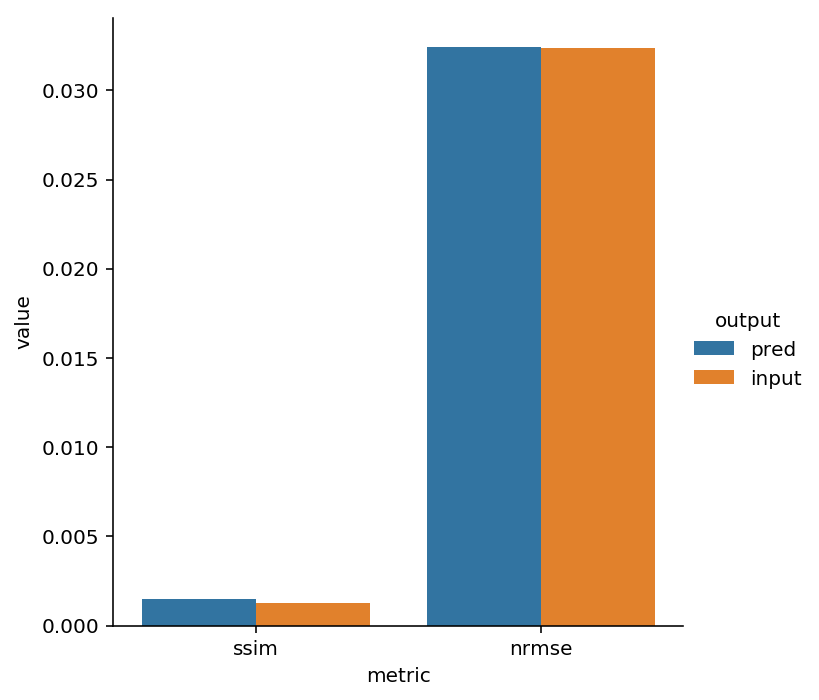

In [30]:
metrics(x, y, pred.mean(), m+'_test_data_test')

## Try z stack one at a time, predictions, I guess?

In [45]:
import util
from skimage.measure import compare_nrmse as nrmse


In [ ]:
def plot_three(X, restored, Y, ix=None, use_ix=True, figsize=(16,10)):
    if use_ix:
        x = X[ix,...,0]
        y = Y[ix,...,0]
        titles = [['input %d' %ix, 'prediction', 'target']]
    else:
        x = X
        y = Y
        titles = [['input', 'prediction', 'target']]
    ims = [[x, restored.mean(), y]]
    plt.figure(figsize=figsize)
    plot_some(np.stack(ims), title_list=titles)

In [32]:
pred = model.predict_probabilistic(x[1,...], 'YX')

pred rmse 0.11492186194367314 ssim 0.0006685060809713693
input rmse 0.11479458266505392 ssim 0.0022842480088541934


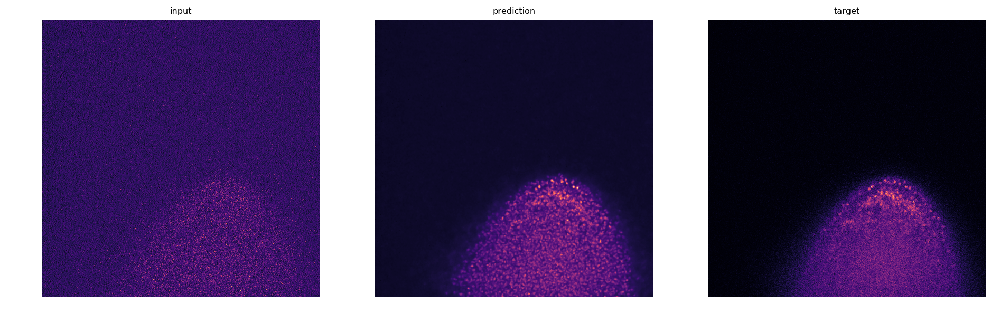

In [46]:
y = imread('data/Denoising_Planaria/test_data/GT/EXP278_Smed_fixed_RedDot1_sub_5_N7_m0001.tif')
x = imread('data/Denoising_Planaria/test_data/condition_1/EXP278_Smed_fixed_RedDot1_sub_5_N7_m0001.tif')
x = np.array(x, dtype='float64')
y = np.array(y, dtype='float64')
y = y[1,...]
x = x[1,...]
plot_three(x, pred, y, use_ix=False)

print('pred rmse', nrmse(y, pred.mean(), 'min-max'), 'ssim', ssim(y, pred.mean()))
print('input rmse', nrmse(y, x, 'min-max'), 'ssim', ssim(y, x))

## Compare 100/200 epochs models


MODEL: 2019-04-01-planaria-1
Loading network weights from 'weights_best.h5'.
pred rmse 0.11492186194367314 ssim 0.0006685060809713693
input rmse 0.11479458266505392 ssim 0.0022842480088541934

MODEL: 2019-04-02-planaria-1.2
Loading network weights from 'weights_best.h5'.
pred rmse 0.11528522499366672 ssim 0.0006449930461366688
input rmse 0.11479458266505392 ssim 0.0022842480088541934

MODEL: 2019-04-02-planaria-2
Loading network weights from 'weights_best.h5'.
pred rmse 0.11425844076536189 ssim 0.0007368467646814654
input rmse 0.11479458266505392 ssim 0.0022842480088541934


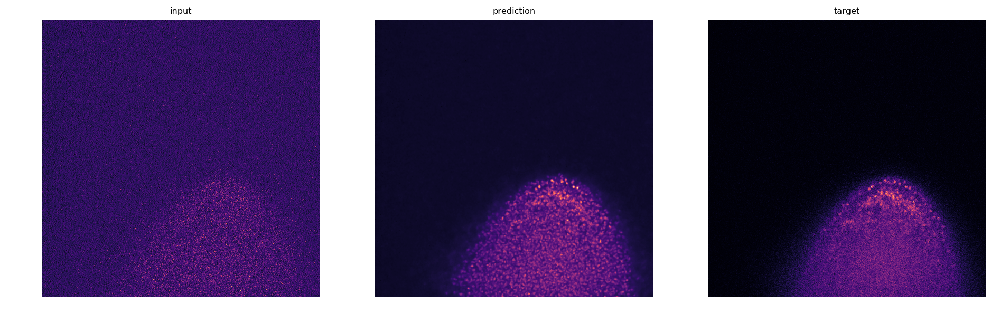

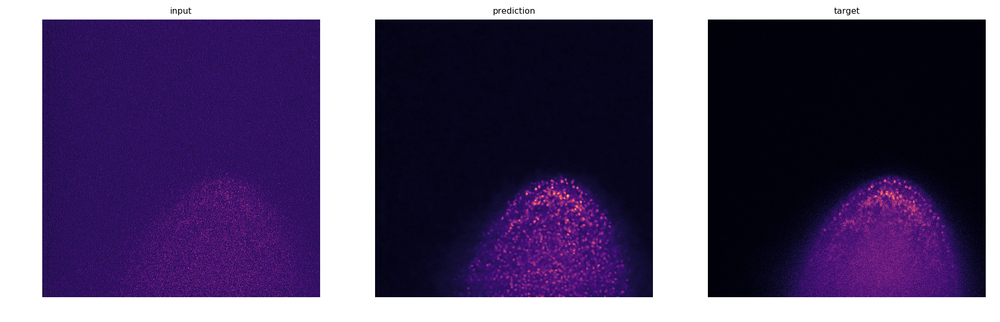

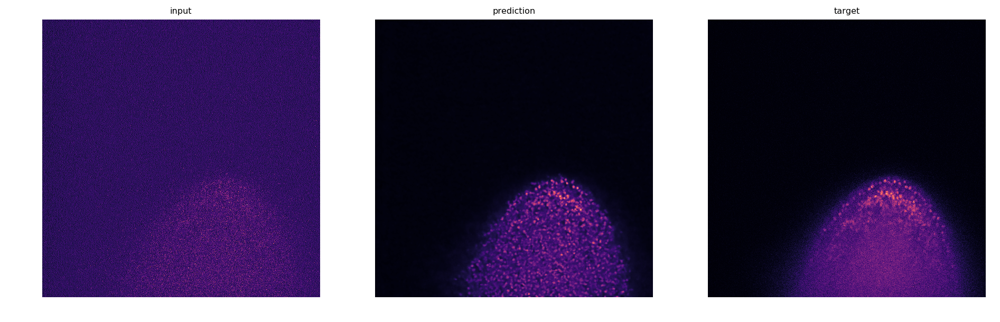

In [49]:
models = ['2019-04-01-planaria-1', '2019-04-02-planaria-1.2', '2019-04-02-planaria-2']
for m in models:
    print('\nMODEL:', m)
    
    y = imread('data/Denoising_Planaria/test_data/GT/EXP278_Smed_fixed_RedDot1_sub_5_N7_m0001.tif')
    x = imread('data/Denoising_Planaria/test_data/condition_1/EXP278_Smed_fixed_RedDot1_sub_5_N7_m0001.tif')
    
    model = CARE(config=None, name=m, basedir='models')
    pred = model.predict_probabilistic(x[1,...], 'YX')

    
    x = np.array(x, dtype='float64')
    y = np.array(y, dtype='float64')
    y = y[1,...]
    x = x[1,...]
    plot_three(x, pred, y, use_ix=False)

    print('pred rmse', nrmse(y, pred.mean(), 'min-max'), 'ssim', ssim(y, pred.mean()))
    print('input rmse', nrmse(y, x, 'min-max'), 'ssim', ssim(y, x))

### but with normalization


MODEL: 2019-04-01-planaria-1
Loading network weights from 'weights_best.h5'.
pred rmse 0.7760925969328719 ssim 0.0006685060809713693
input rmse 0.7752330519846031 ssim 0.0022842480088541934

MODEL: 2019-04-02-planaria-1.2
Loading network weights from 'weights_best.h5'.
pred rmse 0.7785464674874335 ssim 0.0006449930461366688
input rmse 0.7752330519846031 ssim 0.0022842480088541934

MODEL: 2019-04-02-planaria-2
Loading network weights from 'weights_best.h5'.
pred rmse 0.7716123678761221 ssim 0.0007368467646814654
input rmse 0.7752330519846031 ssim 0.0022842480088541934


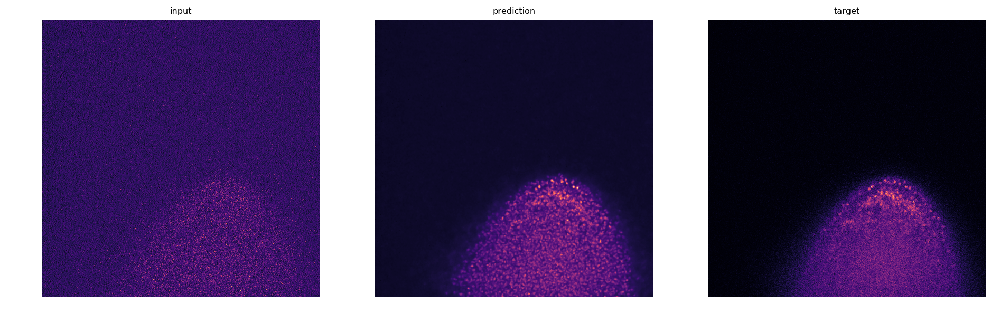

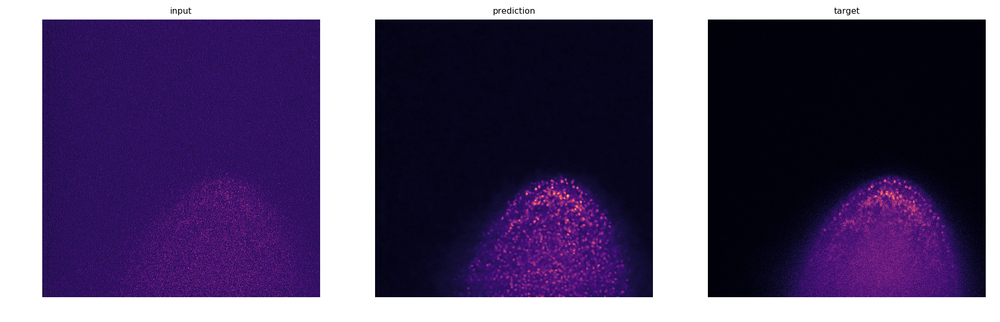

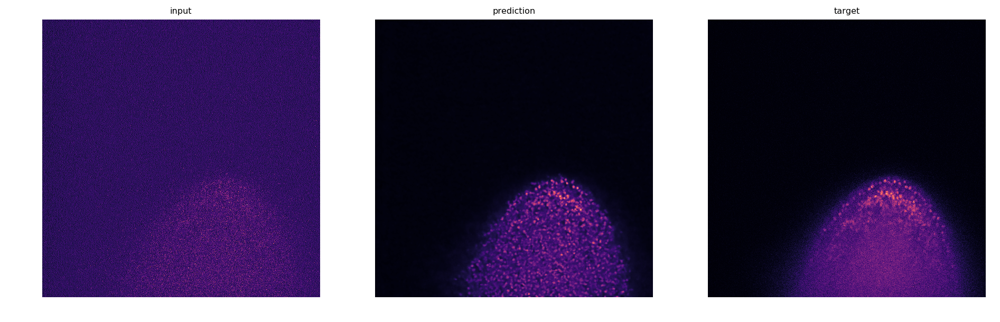

In [53]:
models = ['2019-04-01-planaria-1', '2019-04-02-planaria-1.2', '2019-04-02-planaria-2']
for m in models:
    print('\nMODEL:', m)
    
    y = imread('data/Denoising_Planaria/test_data/GT/EXP278_Smed_fixed_RedDot1_sub_5_N7_m0001.tif')
    x = imread('data/Denoising_Planaria/test_data/condition_1/EXP278_Smed_fixed_RedDot1_sub_5_N7_m0001.tif')
    
    model = CARE(config=None, name=m, basedir='models')
    pred = model.predict_probabilistic(x[1,...], 'YX', PercentileNormalizer())

    
    x = np.array(x, dtype='float64')
    y = np.array(y, dtype='float64')
    y = y[1,...]
    x = x[1,...]
    plot_three(x, pred, y, use_ix=False)
    norm = 'Euclidean'
    print('pred rmse', nrmse(y, pred.mean(), norm), 'ssim', ssim(y, pred.mean()))
    print('input rmse', nrmse(y, x, norm), 'ssim', ssim(y, x))

## random ixs


MODEL: 2019-04-01-planaria-1
Loading network weights from 'weights_best.h5'.


/home/nikoli/.miniconda3/envs/cbsdeep/lib/python3.6/site-packages/seaborn/axisgrid.py:715: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)



MODEL: 2019-04-02-planaria-1.2
Loading network weights from 'weights_best.h5'.


/home/nikoli/.miniconda3/envs/cbsdeep/lib/python3.6/site-packages/seaborn/axisgrid.py:715: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)



MODEL: 2019-04-02-planaria-2
Loading network weights from 'weights_best.h5'.


/home/nikoli/.miniconda3/envs/cbsdeep/lib/python3.6/site-packages/seaborn/axisgrid.py:715: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


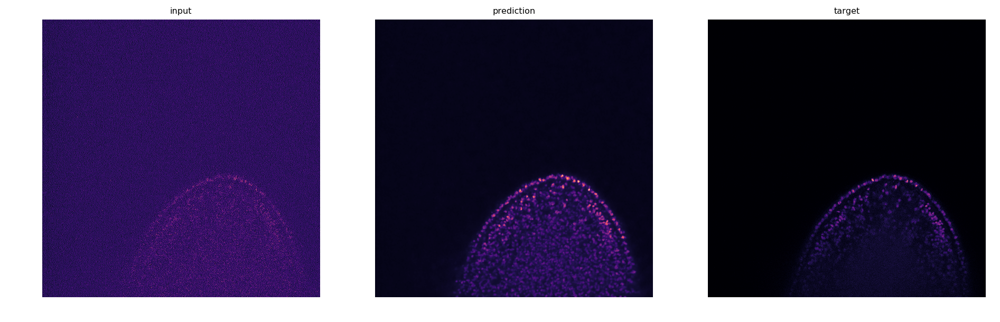

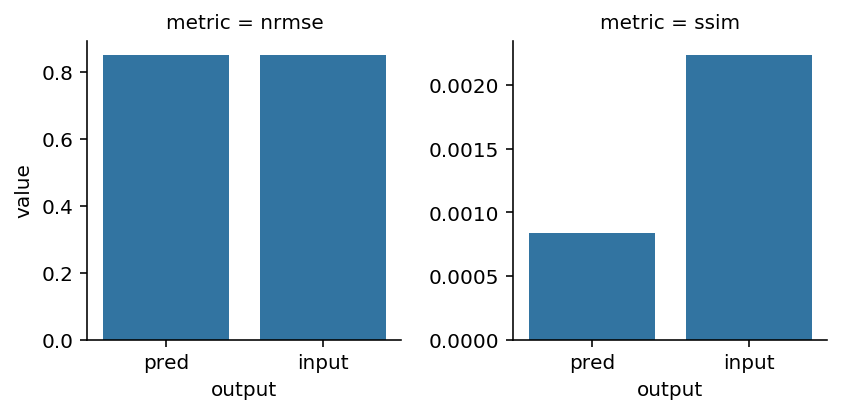

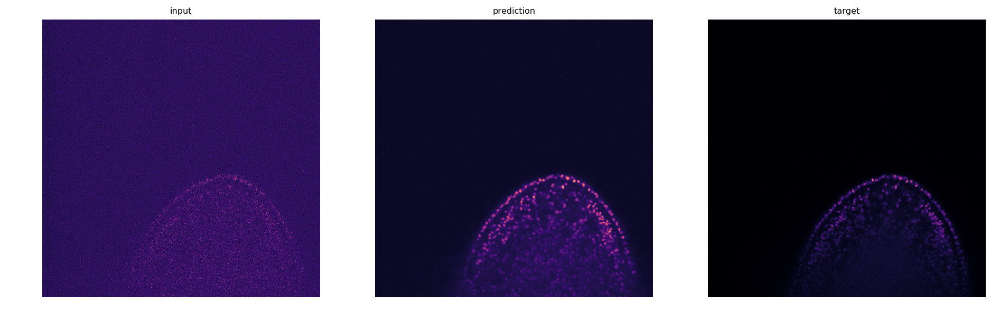

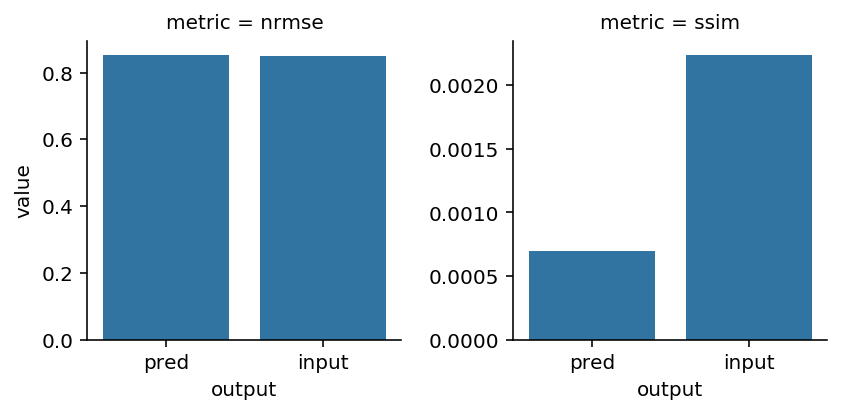

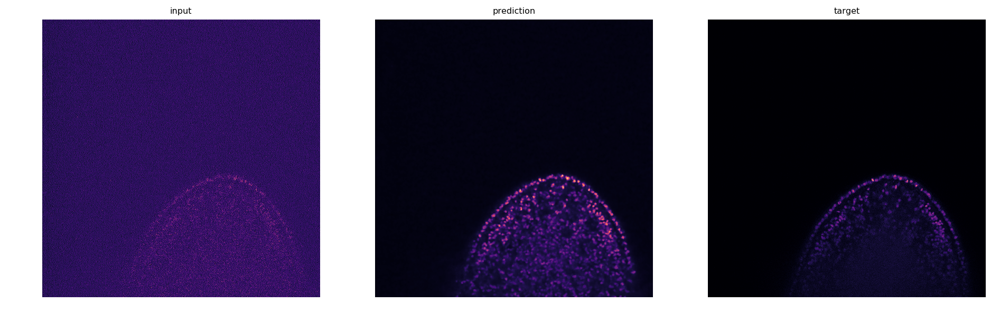

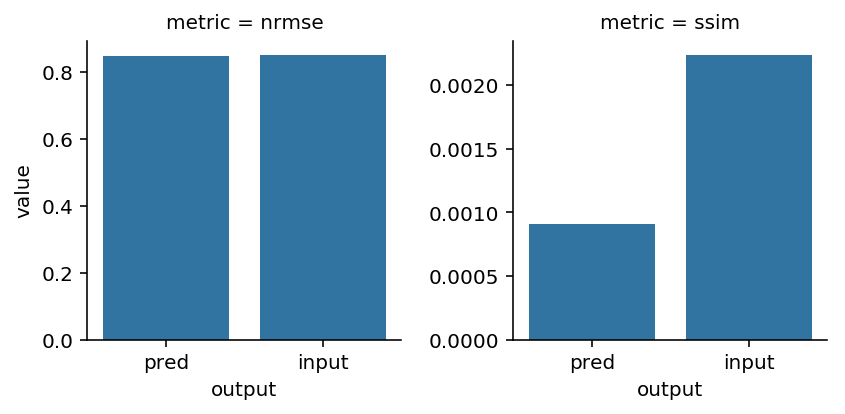

In [76]:
models = ['2019-04-01-planaria-1', '2019-04-02-planaria-1.2', '2019-04-02-planaria-2']
y = imread('data/Denoising_Planaria/test_data/GT/EXP278_Smed_fixed_RedDot1_sub_5_N7_m0001.tif')   

for ix in util.get_randint_ixs(1, len(y)):
    for m in models:
        print('\nMODEL:', m)

        y = imread('data/Denoising_Planaria/test_data/GT/EXP278_Smed_fixed_RedDot1_sub_5_N7_m0001.tif')
        x = imread('data/Denoising_Planaria/test_data/condition_2/EXP278_Smed_fixed_RedDot1_sub_5_N7_m0001.tif')

        model = CARE(config=None, name=m, basedir='models')
        pred = model.predict_probabilistic(x[ix,...], 'YX', PercentileNormalizer())


        x = np.array(x, dtype='float64')
        y = np.array(y, dtype='float64')
        y = y[ix,...]
        x = x[ix,...]
        plot_three(x, pred, y, use_ix=False)
#         plt.show()
        
        norm = 'Euclidean'
        _pred = ['pred', nrmse(y, pred.mean(), norm), ssim(y, pred.mean())]
        _x = ['input', nrmse(y, x, norm), ssim(y, x)]
        df = pd.DataFrame([_pred, _x], columns=['output', 'nrmse', 'ssim'], )
        df = pd.melt(df, id_vars=['output'], var_name='metric')
        g = sns.FacetGrid(df, col='metric', sharey=False)
        g.map(sns.barplot, 'output', 'value')
#         plt.show()